In [1]:
import bayesnewton
import objax
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pandas as pd
from convertbng.util import convert_bng, convert_lonlat
import time
import math
import cv2
import sys, os
sys.path.append('../Utils')
import model_utils as mutils
import kernels_definitions as kerns


/Users/SeanNassimiha/miniforge3/envs/mscjax_dev/lib/python3.8/site-packages/jax/_src/lib/__init__.py:33: UserWarning: JAX on Mac ARM machines is experimental and minimally tested. Please see https://github.com/google/jax/issues/5501 in the event of problems.
  warnings.warn("JAX on Mac ARM machines is experimental and minimally tested. "


In [2]:
#DATA VARIABLES
SYSTEMS_NUM = 20 # 883 is the max
TIMESTEPS_NUM = 30000 # 70571 is the max
TRAIN_FRAC = 0.9
GRID_PIXELS = 18

#OPTIMISATION VARIABLES
LR_ADAM = 0.05
LR_NEWTON = 0.5
ITERS = 30

#GP Variables
VAR_Y = 0.5
VAR_F = 0.5
LEN_TIME = 20 #6 would mean 30 mins
LEN_SPACE = 1

#Want to use a sparse approximation
SPARSE = True
#Should we optimise the inducing points
OPT_Z = True  # will be set to False if SPARSE=SPARSE

#use a mean field approximation?
MEAN_FIELD = False

#Number of FPS for the video of the time evolution of predictions
FPS_VIDEO = 50
VIDEO_LIMIT = 1000
#Select the size of minibatches. Yann LeCun suggests <= 32
MINI_BATCH_SIZE = None  # None if you don't want them

#PATH TO SAVE OUTPUTS
model_string = str(int(MEAN_FIELD)) + "_" + str(int(SYSTEMS_NUM)) + "_" + str(int(TIMESTEPS_NUM))+ "_" + str(int(LEN_TIME)) + "_" + str(int(LEN_SPACE)) + "_" + str(int(ITERS)) + '/'
# model_string = 'Try_periodic_kernel/'
folder = 'output/'+model_string

In [3]:
######################### IMPORTS
data =  pd.read_csv('../../Data/pv_power_df_5day.csv', index_col='datetime').drop(columns=['2657', '2828']) #DROPPING FAULTY SYSTEMS
uk_pv = pd.read_csv('../../Data/system_metadata_location_rounded.csv')
uk_pv['ss_id_string'] = uk_pv['ss_id'].astype('str')

######################### DATASET CREATION
data_multiple = data.iloc[:, :SYSTEMS_NUM][:TIMESTEPS_NUM]
lats = dict(uk_pv.set_index('ss_id')['latitude_rounded'])
longs = dict(uk_pv.set_index('ss_id')['longitude_rounded'])
capacities = uk_pv[uk_pv.ss_id_string.isin(data_multiple.columns)].set_index('ss_id_string')['kwp'].values * 1000
a = data_multiple.reset_index()
stacked = mutils.stack_dataframe(a, lats, longs)

X = np.array(stacked[['epoch', 'longitude', 'latitude']])
Y = np.array(stacked[['PV']])

# convert to easting and northings
british_national_grid_coords = convert_bng(X[:, 1], X[:, 2])
X = np.vstack([X[:, 0],
              np.array(british_national_grid_coords[0]),
              np.array(british_national_grid_coords[1])]).T

In [4]:

# Create a space-time grid from X and Y
t, R, Y = bayesnewton.utils.create_spatiotemporal_grid(X, Y)

# train test split for 3 dimensional data
t_train, t_test, R_train, R_test, Y_train, Y_test = mutils.train_split_3d(t, R, Y, train_frac=TRAIN_FRAC, split_by_day = True)

# get the mask of the test points
test_mask = np.in1d(t.squeeze(), t_test.squeeze())

# Scale the data
scaled_values = mutils.scale_2d_train_test_data(R, Y, R_train, R_test, Y_train, Y_test)
R_scaler, R_scaled, R_train_scaled, R_test_scaled, Y_scaler, Y_scaled, Y_train_scaled, Y_test_scaled = scaled_values

# here get a list of scaled coordinates (frozen because at some point in time)
R_scaled_frozen = R_scaled[0]

# #Create a grid to perform prediction/interpolation on
r1, r2, Rplot = mutils.create_grid_from_coords(R=R_scaled_frozen, t=t, R_scaler=R_scaler, N_pixels=GRID_PIXELS)

if SPARSE:
    z = mutils.create_ind_point_grid(R_scaled_frozen, n_points=None)
else:
    z = R[0, ...]

In [5]:
######################### KERNEL DEFINING
#period in year and in day?
#A day is 96 5min time-steps, therefore the period in days is given by
number_of_days = len(t) / 96
total_length = (t[-1] - t[0]).item()
length_of_one_day = total_length / number_of_days
length_of_one_year = length_of_one_day * 365.25


In [6]:
kern = kerns.get_SpatioTemporal_combined(variance=VAR_F,
                                           lengthscale_time=LEN_TIME,
                                           lengthscale_space=[LEN_SPACE, LEN_SPACE],
                                           z=z,
                                           sparse=SPARSE,
                                           opt_z=OPT_Z,
                                           matern_order = '32',
                                           conditional='Full')
# kern = kerns.get_separate_kernel(variance=VAR_F,
#                                            lengthscale_time=LEN_TIME,
#                                            lengthscale_space=LEN_SPACE,
#                                            z=z,
#                                            sparse=SPARSE,
#                                            opt_z=OPT_Z,
#                                            conditional='Full')


In [7]:
######################### MODEL TRAINING
lik = bayesnewton.likelihoods.Gaussian(variance=VAR_Y)

if MEAN_FIELD:
    model_loaded = bayesnewton.models.MarkovVariationalMeanFieldGP(kernel=kern, likelihood=lik, X=t_train, R=R_train_scaled, Y=Y_train_scaled, parallel = True)
else:
    inf = bayesnewton.inference.Taylor
    mod = bayesnewton.basemodels.MarkovGP
    Mod = bayesnewton.build_model(mod, inf)
    model_loaded = Mod(kernel=kern, likelihood=lik, X=t_train, Y=Y_train_scaled, R=R_train_scaled)
model_name = folder+'model.npz'
objax.io.load_var_collection(model_name, model_loaded.vars())
# posterior_mean_ts_loaded, posterior_var_ts_loaded = model_loaded.predict(X=t, R=R_scaled)


/Users/SeanNassimiha/miniforge3/envs/mscjax_dev/lib/python3.8/site-packages/jax/_src/numpy/lax_numpy.py:5373: UserWarning: 'kind' argument to argsort is ignored; only 'stable' sorts are supported.
  warnings.warn("'kind' argument to argsort is ignored; only 'stable' sorts "


In [8]:
#INITIAL APPROACH
# t0 = time.time()
# print('calculating the posterior predictive distribution ...')
# posterior_mean, posterior_var = model_loaded.predict(X=t, R=Rplot)
# t1 = time.time()
# print('prediction time: %2.2f secs' % (t1-t0))

n_batches = int(Rplot.shape[1] / 20) + 1
test_split = np.array_split(Rplot, n_batches, axis=1)

# calculate posterior predictive distribution via filtering and smoothing at train & test locations:
print('calculating the posterior predictive distribution ...')

posterior_mean = np.zeros((TIMESTEPS_NUM, 1))
posterior_variance = np.zeros((TIMESTEPS_NUM, 1))

t0 = time.time()
for mini_batch in range(n_batches):
    post_mean, post_var = model_loaded.predict(X=t, R=test_split[mini_batch])
    posterior_mean = np.append(posterior_mean, post_mean, axis=1)
    posterior_variance = np.append(posterior_variance, post_var,axis=1)
posterior_mean = posterior_mean[:,1:]
posterior_variance = posterior_variance[:,1:]
t1 = time.time()
print('prediction time: %2.2f secs' % (t1-t0))



calculating the posterior predictive distribution ...
enter spatial_conditional in the compute_full_pseudo_lik with X  (26993, 1) and R (26993, 20, 2)
enter spatial_conditional in the compute_full_pseudo_lik with X  (26993, 1) and R (26993, 20, 2)
enter spatial_conditional in the compute_full_pseudo_lik with X  (26993, 1) and R (26993, 20, 2)
enter spatial_conditional in the compute_full_pseudo_lik with X  (26993, 1) and R (26993, 20, 2)
enter spatial_conditional in the compute_full_pseudo_lik with X  (26993, 1) and R (26993, 20, 2)
enter spatial_conditional in the compute_full_pseudo_lik with X  (26993, 1) and R (26993, 20, 2)
enter spatial_conditional in the compute_full_pseudo_lik with X  (26993, 1) and R (26993, 20, 2)
enter spatial_conditional in the compute_full_pseudo_lik with X  (26993, 1) and R (26993, 20, 2)
enter spatial_conditional in the compute_full_pseudo_lik with X  (26993, 1) and R (26993, 20, 2)
enter spatial_conditional in the compute_full_pseudo_lik with X  (26993, 

In [9]:
t2 = time.time()
print('calculating the negative log predictive density ...')
nlpd = model_loaded.negative_log_predictive_density(X=t_test, R=R_test_scaled, Y=Y_test_scaled)
t3 = time.time()
print('nlpd calculation time: %2.2f secs' % (t3-t2))
print('nlpd: %2.3f' % nlpd)


calculating the negative log predictive density ...
enter spatial_conditional in the compute_full_pseudo_lik with X  (26993, 1) and R (26993, 20, 2)
nlpd calculation time: 4.59 secs
nlpd: 1.360


In [10]:
########################## PLOT THE GRID PREDICTIONS

z_opt = model_loaded.kernel.z.value
mu = Y_scaler.inverse_transform(posterior_mean.flatten()[:, np.newaxis]).reshape(-1, GRID_PIXELS, GRID_PIXELS)
Y = Y_scaler.inverse_transform(Y_scaled[:,:,0])

#get lat-lon coordinates
grid_coord = R_scaler.inverse_transform(np.array(np.c_[r1,r2]))
longitude_grid, latitude_grid =  convert_lonlat(grid_coord[:, 0], grid_coord[:, 1])
longitude_sys_train, latitude_sys_train = convert_lonlat(R_train[:,:,0][0], R_train[:,:,1][0])
longitude_z, latitude_z = convert_lonlat(R_scaler.inverse_transform(z_opt)[:,0], R_scaler.inverse_transform(z_opt)[:,1])


plotting ...


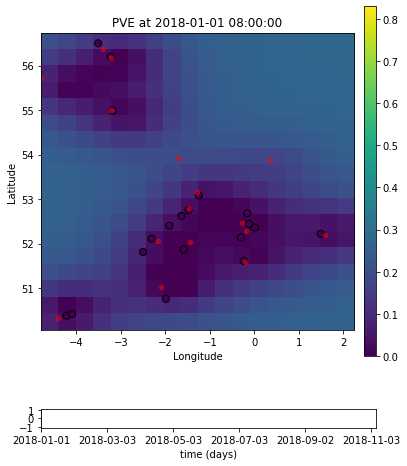

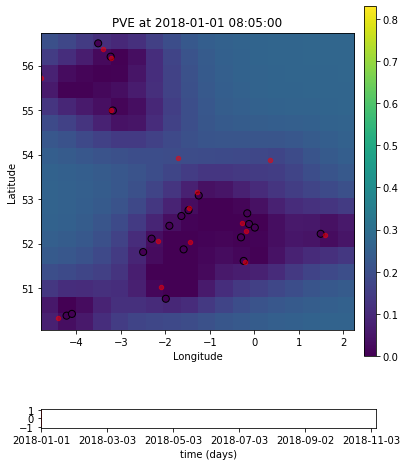

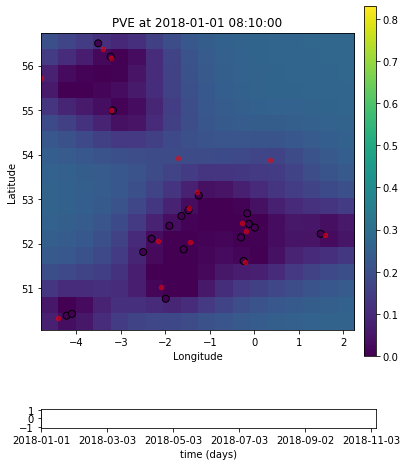

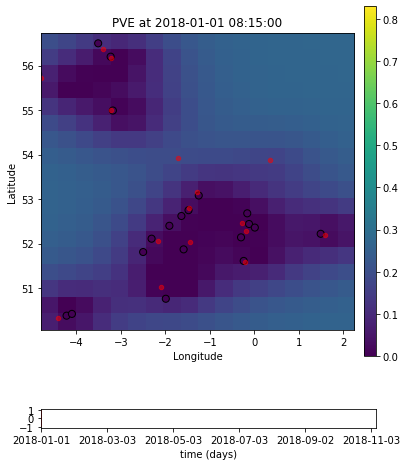

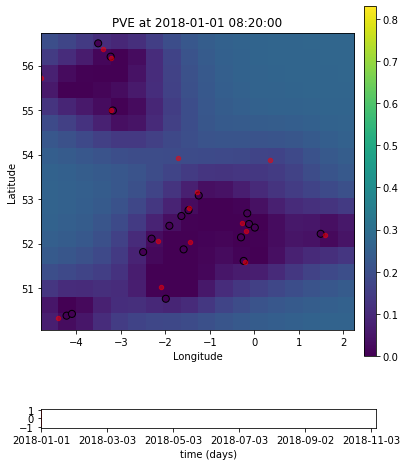

...

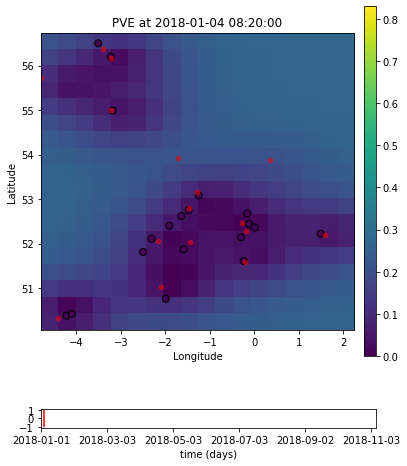

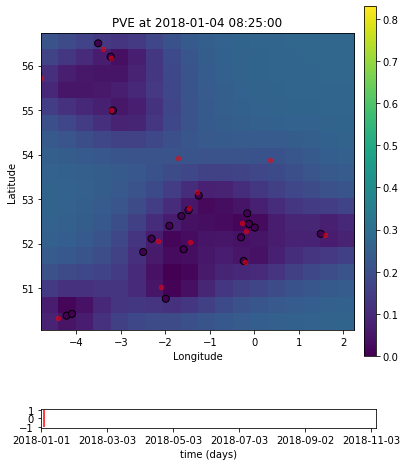

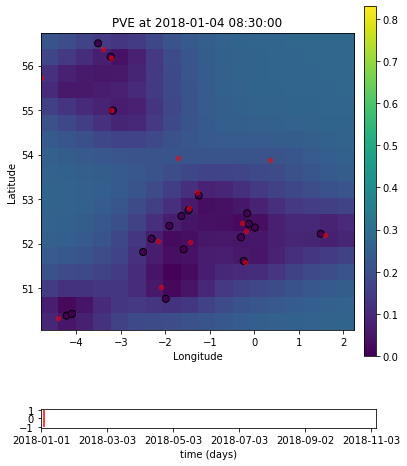

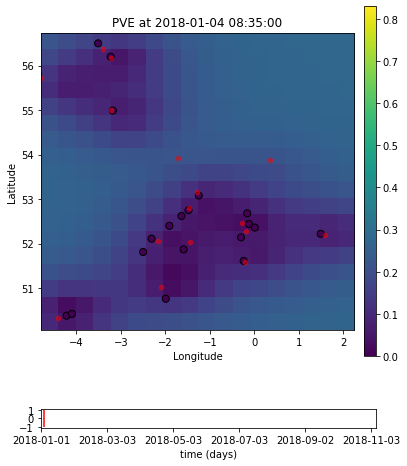

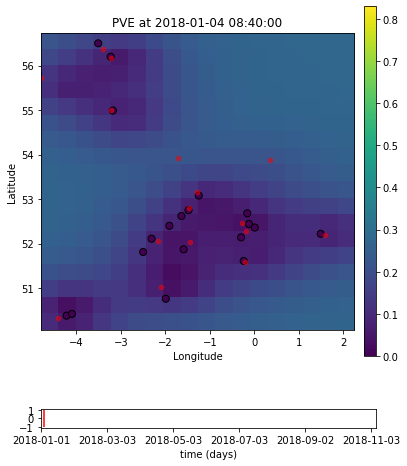

In [11]:
print('plotting ...')
cmap = cm.viridis
vmin = np.nanpercentile(Y, 1)
vmax = np.nanpercentile(Y, 99)
#get the labels for the dates
dates = pd.to_datetime(a.datetime).dt.date
days_index = max(97, int(((len(t) / 5) // 97) * 97)) #number of time intervals to match 5 beginnings of days

for time_step in range(t.shape[0])[:300]:
    f, (a0, a1) = plt.subplots(2, 1, gridspec_kw={'height_ratios': [20, 1]})
    f.set_figheight(8)
    # f.set_figwidth(8)
    im = a0.imshow(mu[time_step], cmap=cmap, vmin=vmin, vmax=vmax,
                   extent=[longitude_grid[0], longitude_grid[-1], latitude_grid[0], latitude_grid[-1]], origin='lower')
    a0.scatter(longitude_sys_train, latitude_sys_train, cmap=cmap, vmin=vmin, vmax=vmax,
               c=np.squeeze(Y[time_step]), s=50, edgecolors='black')
    plt.colorbar(im, fraction=0.0348, pad=0.03, aspect=30, ax=a0)
    if SPARSE:
        a0.scatter(longitude_z, latitude_z, c='r', s=20, alpha=0.5)  # plot inducing inputs
    a0.set_xlim(longitude_grid[0], longitude_grid[-1])
    a0.set_ylim(latitude_grid[0], latitude_grid[-1])
    a0.set_title(f'PVE at {a.datetime.unique()[time_step]}')
    a0.set_ylabel('Latitude')
    a0.set_xlabel('Longitude')
    a1.vlines(t[time_step].item(), -1, 1, 'r')
    a1.set_xlabel('time (days)')
    a1.set_xlim(t[0], t[-1])

    a1.set_xticks(np.asarray(t[1:-1:days_index][:, 0].tolist()),
                  labels=dates[0:-1:days_index].values,
                  fontsize=10)
    plt.show()
    

In [12]:
#GET THE SYSTEM SPECIFIC PREDICTIONS (NOT THE TOTAL INTERPOLATION)
posterior_mean_ts, posterior_var_ts = model_loaded.predict(X=t, R=R_scaled)
posterior_mean_rescaled = Y_scaler.inverse_transform(posterior_mean_ts)
posterior_pos_twostd_rescaled = Y_scaler.inverse_transform(posterior_mean_ts + 1.96 * np.sqrt(posterior_var_ts))
posterior_neg_twostd_rescaled = Y_scaler.inverse_transform(posterior_mean_ts - 1.96 * np.sqrt(posterior_var_ts))

rescaled_Y = (Y * capacities)
doubly_rescaled_posterior = posterior_mean_rescaled * capacities

#adjust this for the correct quantities
rmse = np.sqrt(np.nanmean((np.squeeze(rescaled_Y) - np.squeeze(doubly_rescaled_posterior))**2))
print(f'The RMSE is {rmse.round(3)}')

rmse_train = np.sqrt(np.nanmean((np.squeeze(rescaled_Y[~test_mask]) - np.squeeze(doubly_rescaled_posterior[~test_mask]))**2))
print(f'The train RMSE is {rmse_train.round(3)}')

rmse_test = np.sqrt(np.nanmean((np.squeeze(rescaled_Y[test_mask]) - np.squeeze(doubly_rescaled_posterior[test_mask]))**2))
print(f'The test RMSE is {rmse_test.round(3)}')


enter spatial_conditional in the compute_full_pseudo_lik with X  (26993, 1) and R (26993, 20, 2)
The RMSE is 690.66
The train RMSE is 689.728
The test RMSE is 698.97


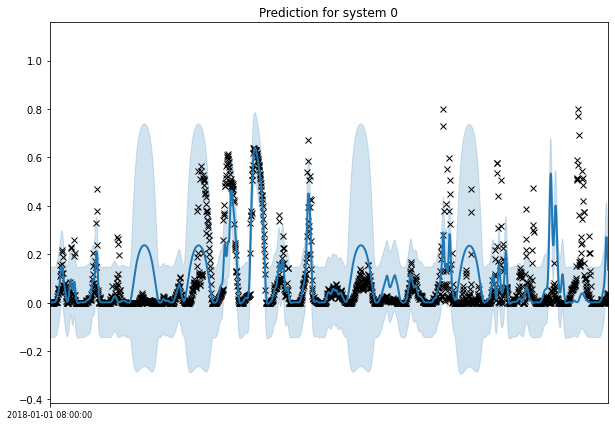

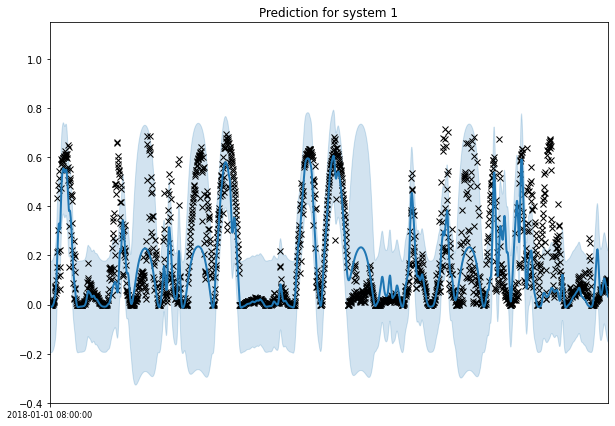

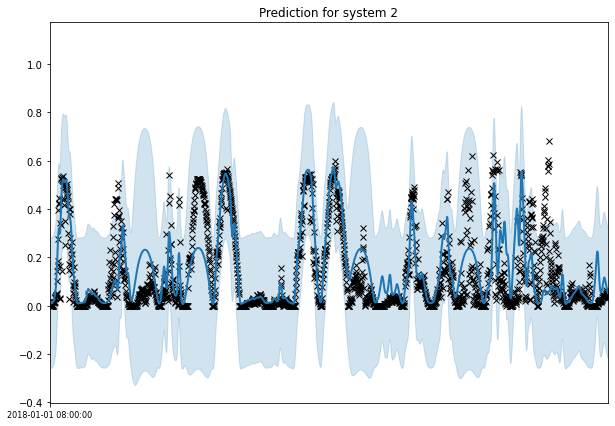

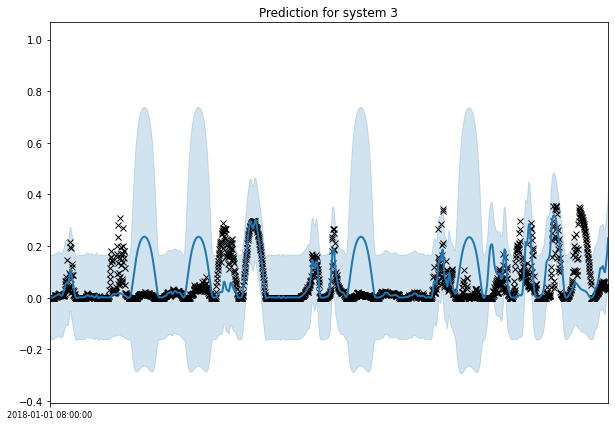

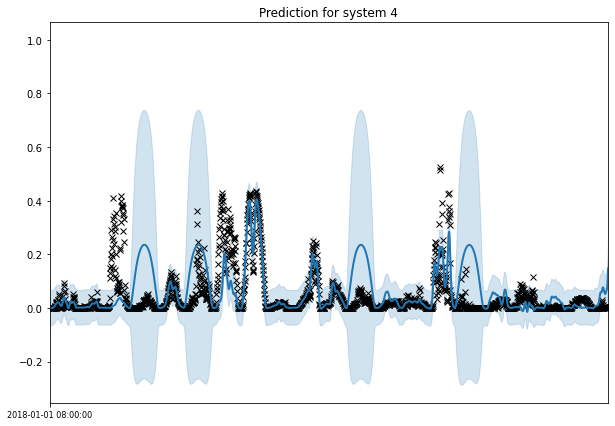

...

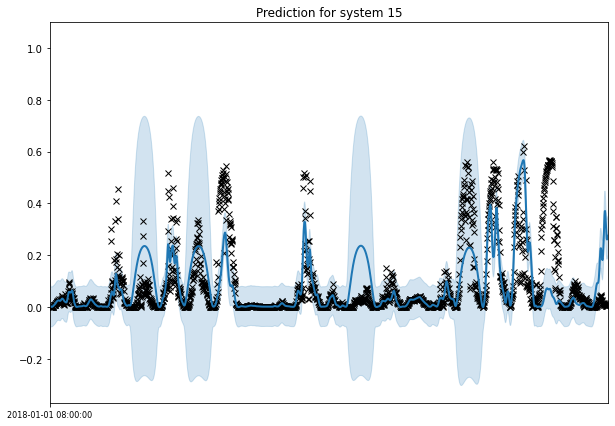

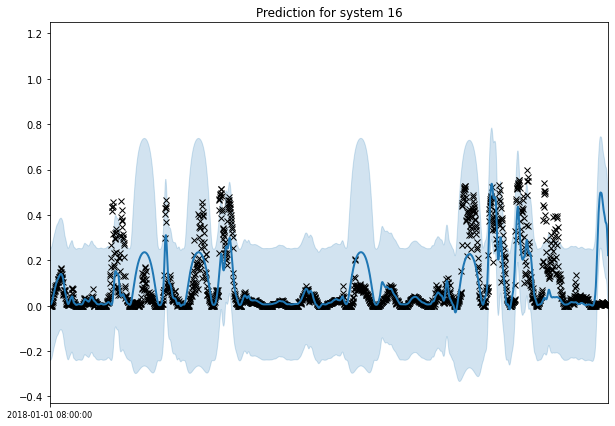

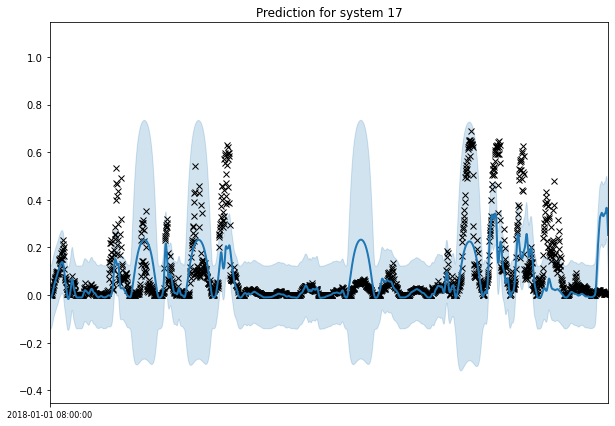

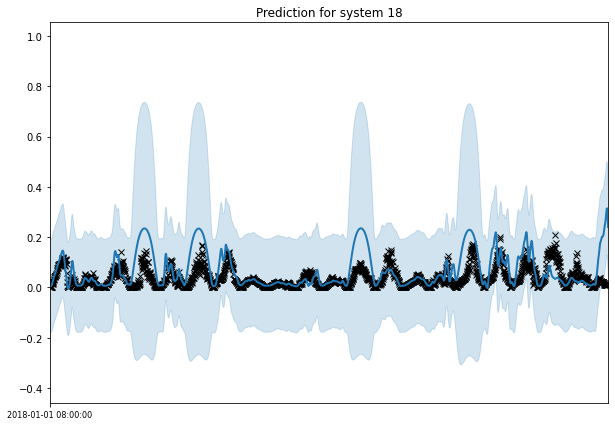

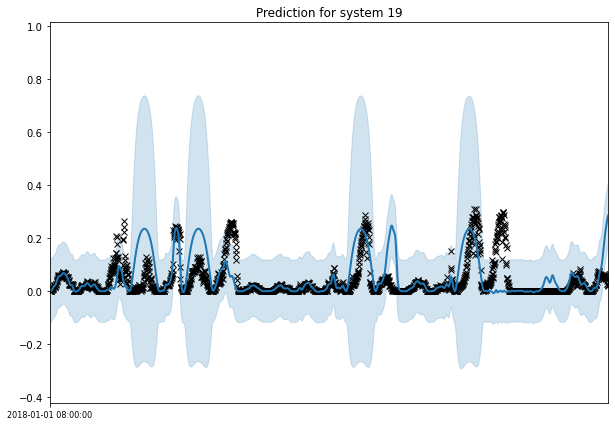

In [16]:
for i in range(SYSTEMS_NUM):
    plt.figure(figsize=(10,7))
    plt.title(f'Prediction for system {i}')
    plt.plot(np.arange(len(Y)), Y[:,i], "xk")
    plt.plot(np.arange(len(Y)), posterior_mean_rescaled[:,i], c="C0", lw=2, zorder=2)
    plt.fill_between(
        np.arange(len(Y)),
        posterior_neg_twostd_rescaled[:,i],
        posterior_pos_twostd_rescaled[:,i],
        color="C0",
        alpha=0.2)
    plt.xticks(ticks = np.arange(len(Y))[0:-1:days_index], labels = a.datetime[0:-1:days_index].values, size=8)

    plt.xlim(0, 2000)
    
    
    